# 🌍 Smart Energy Supply Scheduling for Green Telecom Challenge
## 📅 **Date**: 05/10/2024
### 👤 **Author**: Mohamed Khlifi  
### 🎓 **Ecole Polytechnique de Tunisie**  

---

## 📜 **Challenge Overview**
The ICT industry currently consumes approximately **3%** of the world's energy, contributing about **3%** of global carbon emissions. The mobile industry is committed to achieving **net-zero emissions by 2050**, with over **90%** of network costs attributed to energy bills. The rising costs of energy (diesel prices increasing by **55% YOY** and electricity by **38% YOY**) emphasize the urgency for a green transformation in the telecom sector.

Mobile networks rely on diverse energy sources, including traditional electricity grids, solar panels, and diesel generators. This challenge focuses on developing a strategy to optimize the use of these energy sources, aiming to minimize network energy costs while ensuring stability.

---

## 🎯 **Objective**
The objective is to design a strategy that minimizes network energy costs while maintaining the battery's capacity above a defined threshold. The model must predict daily solar energy generation and determine the optimal usage of grid, solar, and diesel energy sources.

## 🏆 **Achievements**
This notebook showcases my solution, which ranked **2nd** in the Smart Energy Supply Scheduling for Green Telecom Challenge by the **International Telecommunication Union (ITU)**.

---


# Imports

In [1]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
import time
import warnings
warnings.filterwarnings('ignore')

# Configuration

In [2]:
class Config:
    Data_dir = "/kaggle/input/zindi-new-energy-competition" # your data directory
    Solar_cycle=30
    Solar_period=7
    Hours_to_pred=168
    Security_DOD_rate=0.1
    Security_of_discharge_factor=4
    diesel_num_penalty=300
    diesel_usage_penalty=1
    diesel_max_time_penalty=0.95
    grid_usage_penalty=0.25
    quarter=15

In [3]:
# Load the datasets
site_info = pd.read_csv(os.path.join(Config.Data_dir, "site information and grid outage.csv"))
energy_consumption = pd.read_csv(os.path.join(Config.Data_dir, "energy consumption.csv"))
solar_power = pd.read_csv(os.path.join(Config.Data_dir, "solar power and weather condition.csv"))

# to calculate latency of (data processing, modeling and inference) we start time juste after loading the data
latency = 0
start = time.time()

# Data Preprocessing

In [4]:
def convert_type(bool_list):
    bool_list = eval(bool_list.replace(" ", ",").replace('true', 'True').replace('false', 'False'))
    return bool_list
site_info["grid outage plan"] = site_info["grid outage plan"].apply(convert_type)
latency += time.time() - start
print("Stopping calculating latency for EDA")

Stopping calculating latency for EDA


**Next Step**:
- Dive into Exploratory Data Analysis for further understanding of the data

# Exploratory Data Analysis
The EDA will be organized as follows:

1. **Univariate Analysis**: Analyze the distribution of individual variables in each dataset.
2. **Time series Analysis**: Understand how energy consumption and solar power varies over time.


### 1. Univariate Analysis

In this section, we will analyze the distribution of individual variables in the dataset. We'll visualize the distributions of key columns such as **Energy Output(kWh)** [ Solar power ] and the **Total Energy(kWh)** [ Demand ]  


In [5]:
def plot_distribution(data,param):
    if param =='solar': label ='Energy Output(kWh)'
    else: label ='Total Energy(kWh)'

    # Set style for seaborn plots
    sns.set_style("whitegrid")

    current_palette = sns.color_palette("coolwarm", 2)
    sns.set_palette(current_palette)

    plt.figure(figsize=(12, 6))
    sns.histplot(data[label], bins=30, kde=False, color=current_palette[0])
    sns.kdeplot(data[label], color=current_palette[1], shade=True)

    mean_E = data[label].mean()
    median_E = data[label].median()

    plt.axvline(mean_E, color='red', linestyle='--', label=f"Mean: {mean_E:.2f}")
    plt.axvline(median_E, color='green', linestyle='-', label=f"Median: {median_E:.2f}")

    plt.title(f'Distribution of {label}', fontsize=18, fontweight='bold')
    plt.xlabel(label, fontsize=15)
    plt.ylabel('Count', fontsize=15)
    plt.legend(fontsize=12)

    sns.despine()

    plt.tight_layout()
    plt.show()


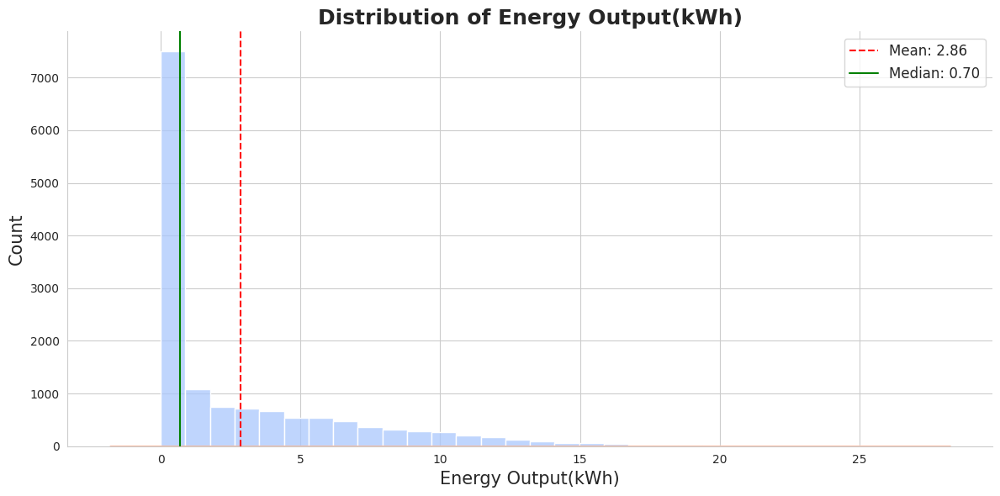

In [6]:
plot_distribution(solar_power,'solar')

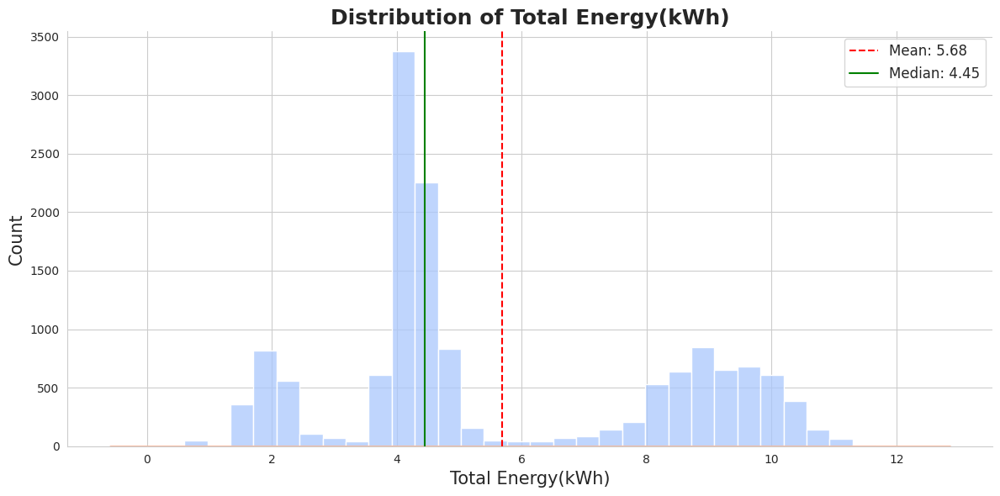

In [7]:
plot_distribution(energy_consumption,'Energy_consumption')

### 2. Time series Analysis
In this section, we will explore the temporal patterns present in the solar power generation and energy consumption data. By visualizing these variables over time, we aim to uncover trends, periodicity, and other temporal behaviors that could be useful for forecasting and optimization.


#### 2.1 Average Solar Power Generation - Energy consumption  Over Sites

We begin by examining the variation of the average solar power generation and energy consumption data across all sites.


In [8]:
def plot_time_series_variable(data,param):
    if param =='solar':
        label ='Energy Output(kWh)'
        color='royalblue'
    else:
        label ='Total Energy(kWh)'
        color='red'
    data['time']=(data['Day']-1)*24+data['Hour']

    sns.set_style("whitegrid")
    sns.set_context("talk")

    plt.figure(figsize=(18, 8))
    avg_energy = data.groupby('time')[label].mean()
    avg_energy.plot(linewidth=2.5, color=color, alpha=0.8)


    plt.fill_between(avg_energy.index, avg_energy.values, color=color, alpha=0.1)
    plt.title(f'Time Series of Average {label} over sites', fontsize=24, fontweight='bold')
    plt.xlabel('Time', fontsize=18)
    plt.ylabel(f'Average {label}', fontsize=18)

    sns.despine()
    plt.tight_layout()
    plt.show()


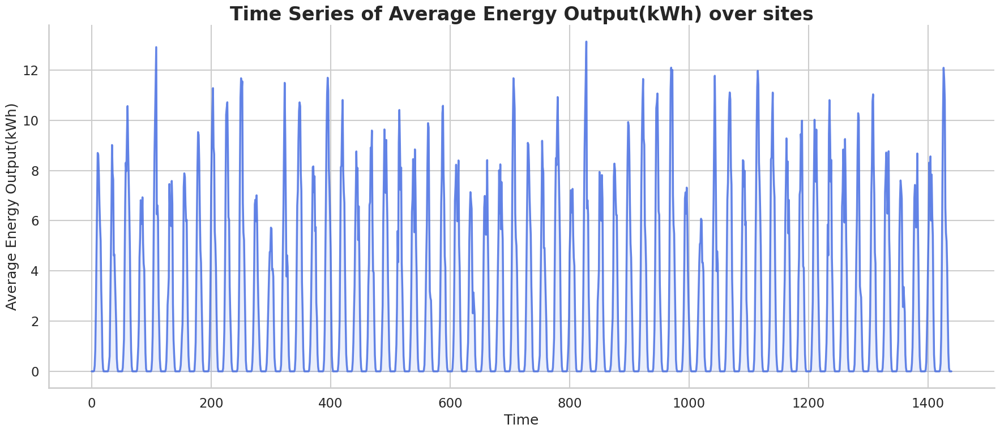

In [9]:
plot_time_series_variable(solar_power,'solar')

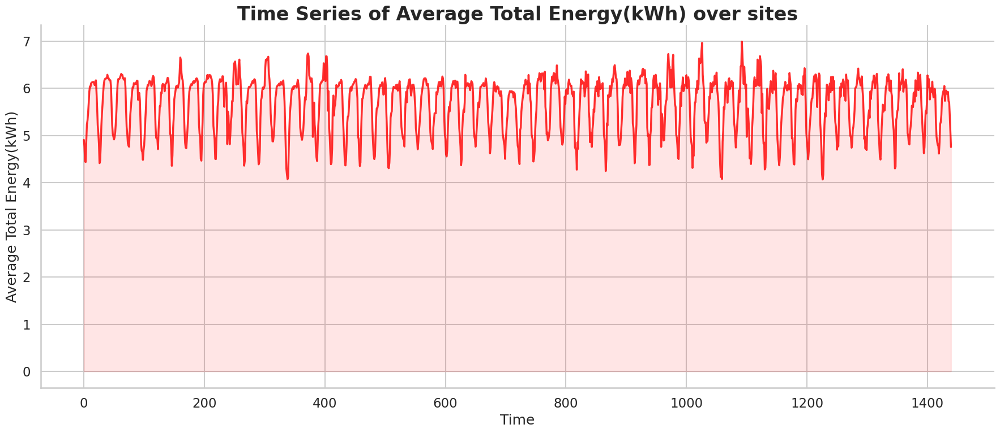

In [10]:
plot_time_series_variable(energy_consumption,'Demand')

#### 2.2 Solar Power Generation - Energy consumption  

We begin by examining the variation of the solar power generation and energy consumption data for each site. Understanding how solar power fluctuates with time can help in predicting energy availability, especially in scenarios where renewable energy sources are a significant contributor.

*Key Questions:*
- How does solar power change over different days and weeks?
- Are there any apparent trends or periodic patterns in the data?
- When does the solar power cover the demand ?
- Power balance and grid availability ?

In [11]:
def plot_solar_vs_demand(solar_data,energy_consumption_data):
    solar_data=solar_data[['Site Name','Day','Hour','Energy Output(kWh)']]
    data=pd.merge(solar_data,energy_consumption_data,on=['Hour','Day','Site Name'])
    data['time']=(data['Day']-1)*24+data['Hour']
    sites=data['Site Name'].unique()
    sorted_sites = np.sort([site for site in sites if site != 'site10'])
    sorted_sites = np.append(sorted_sites, 'site10')
    for site in sorted_sites:
        site_data= data.loc[data['Site Name']==site]
        sns.set_style("whitegrid")
        sns.set_context("talk")

        plt.figure(figsize=(18, 6))
        plt.plot(site_data['time'], site_data['Energy Output(kWh)'], color='royalblue', label='Solar Power', linewidth=2.5, alpha=0.8)

        # Plot Demand
        plt.plot(site_data['time'], site_data['Total Energy(kWh)'], color='red', label='Demand', linewidth=2.5, alpha=0.8)

        # Fill area where solar power is less than demand (hatch = blue)
        plt.fill_between(site_data['time'], site_data['Energy Output(kWh)'], site_data['Total Energy(kWh)'],
                         where=(site_data['Energy Output(kWh)'] < site_data['Total Energy(kWh)']),
                         facecolor='none', hatch='/////', edgecolor='red', alpha=0.4)

        # Fill area where demand is less than solar power (hatch = red)
        plt.fill_between(site_data['time'], site_data['Total Energy(kWh)'], site_data['Energy Output(kWh)'],
                         where=(site_data['Total Energy(kWh)'] < site_data['Energy Output(kWh)']),
                         facecolor='none', hatch='\\\\\\\\\\\\', edgecolor='royalblue', alpha=0.4)

        # Titles and labels
        plt.title(f'Time Series of Solar Power vs. Demand {site}', fontsize=24, fontweight='bold')
        plt.xlabel('Time', fontsize=18)
        plt.ylabel('Energy (kWh)', fontsize=18)

        plt.legend(fontsize=16)
        sns.despine()
        plt.tight_layout()
        plt.show()

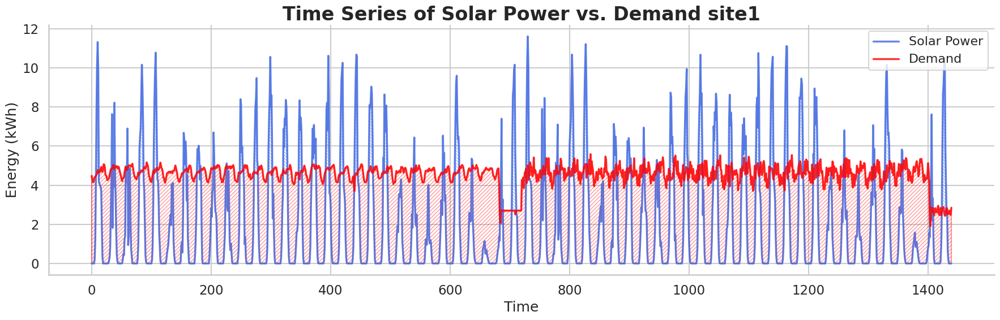

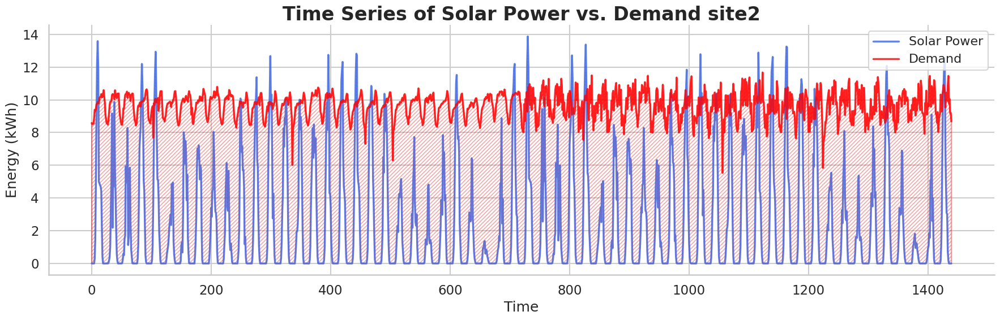

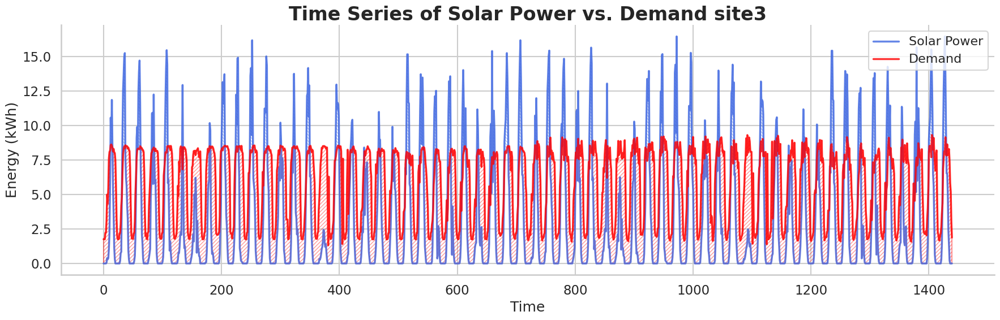

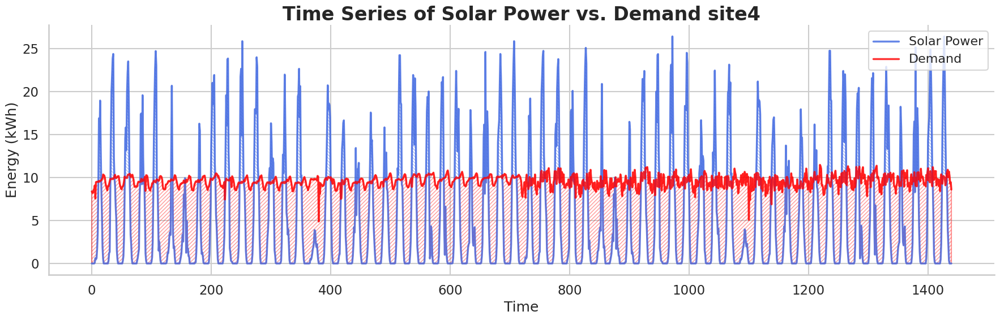

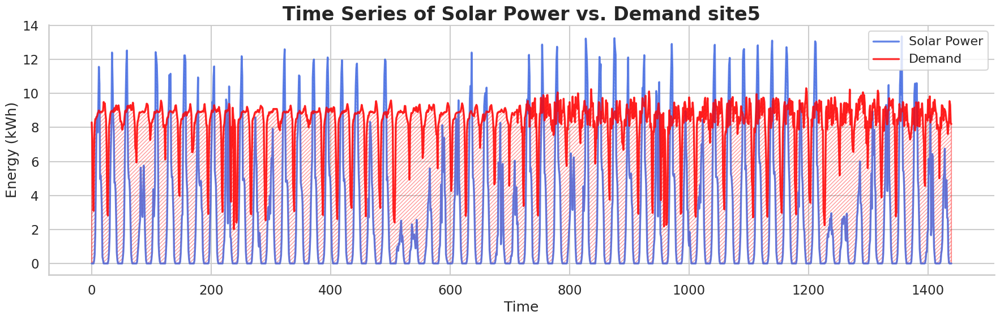

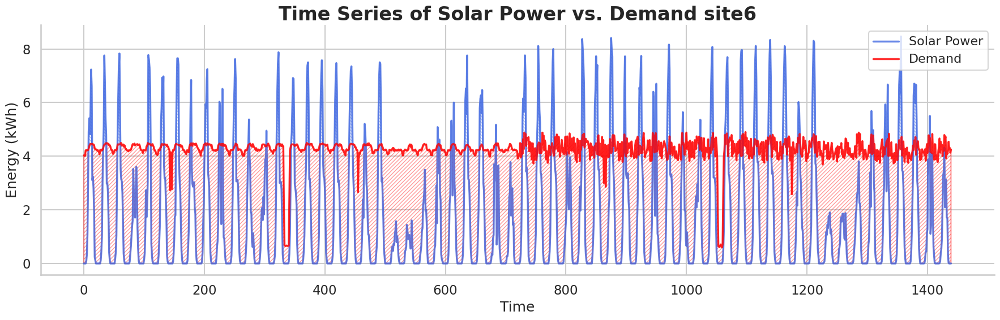

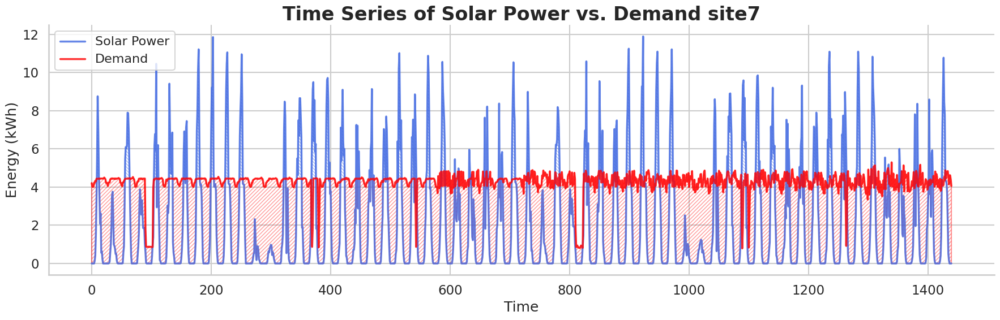

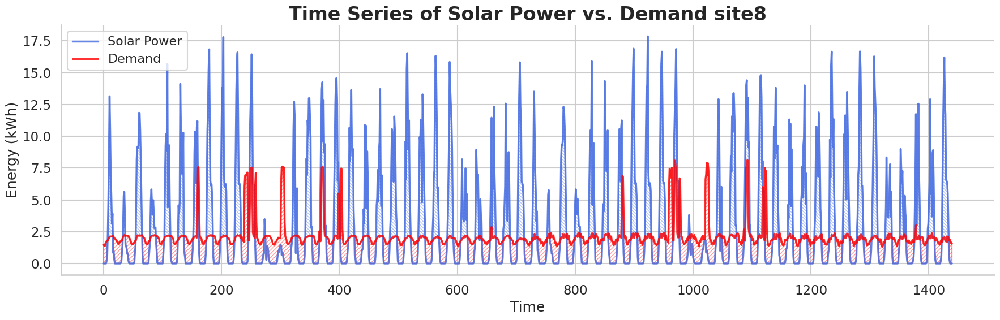

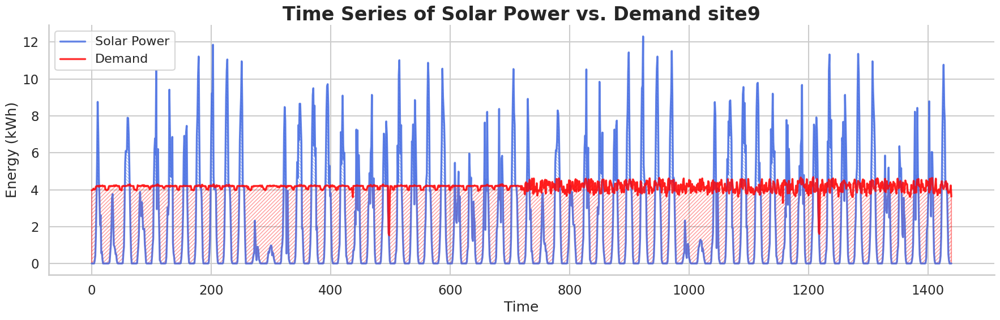

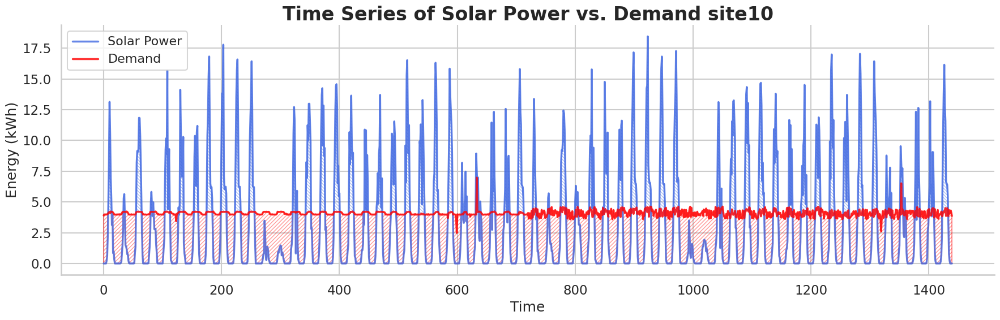

In [12]:
plot_solar_vs_demand(solar_power,energy_consumption)

# Predictions

Given the constraint of keeping inference time under **1 second** and the unpredictability of the total energy consumption, I focused more on the strategy.

I approximated the values for **Total Energy (kWh)** and **Energy Output (kWh)** for each hour of the test week by using the **mean of historical energy data** from the past two months. This method provides a reasonable estimate while maintaining the required performance speed.


In [13]:
def calculate_statistical_props(data,str):
    label='Energy Output(kWh)' if str=='solar' else 'Total Energy(kWh)'
    print(label)
    print("=" * 50)
    print(f"{'First Cycle [Month]':^50}")
    print("=" * 50)
    print(f"{'Week':^10} | {'Mean (kWh)':^15} | {'Std Dev (kWh)':^15}")
    print("-" * 50)

    for week in range(4):
        df_week = data.loc[data.Day.isin(range((week * Config.Solar_period), (week * Config.Solar_period) + Config.Solar_period+1))]
        mean_value = df_week[label].mean()
        std_value = df_week[label].std()
        print(f"{week + 1:^10} | {mean_value:>13.2f} | {std_value:>14.2f}")

    print("\n" + "=" * 50)
    print(f"{'Second Cycle [Month]':^50}")
    print("=" * 50)
    print(f"{'Week':^10} | {'Mean (kWh)':^15} | {'Std Dev (kWh)':^15}")
    print("-" * 50)

    for week in range(4):
        df_week = data.loc[data.Day.isin(range((week * Config.Solar_period) +Config.Solar_cycle, (week * Config.Solar_period) +  Config.Solar_period+1 +Config.Solar_cycle))]
        mean_value = df_week[label].mean()
        std_value = df_week[label].std()
        print(f"{week + 1:^10} | {mean_value:>13.2f} | {std_value:>14.2f}")

    print("=" * 50)

In [14]:
calculate_statistical_props(solar_power,'solar')

Energy Output(kWh)
               First Cycle [Month]                
   Week    |   Mean (kWh)    |  Std Dev (kWh) 
--------------------------------------------------
    1      |          2.66 |           3.93
    2      |          2.73 |           4.08
    3      |          3.01 |           3.97
    4      |          2.70 |           4.04

               Second Cycle [Month]               
   Week    |   Mean (kWh)    |  Std Dev (kWh) 
--------------------------------------------------
    1      |          2.85 |           4.14
    2      |          2.84 |           4.18
    3      |          3.12 |           4.09
    4      |          2.83 |           4.16


In [15]:
calculate_statistical_props(energy_consumption,'demand')

Total Energy(kWh)
               First Cycle [Month]                
   Week    |   Mean (kWh)    |  Std Dev (kWh) 
--------------------------------------------------
    1      |          5.70 |           2.70
    2      |          5.75 |           2.63
    3      |          5.66 |           2.67
    4      |          5.65 |           2.70

               Second Cycle [Month]               
   Week    |   Mean (kWh)    |  Std Dev (kWh) 
--------------------------------------------------
    1      |          5.67 |           2.74
    2      |          5.75 |           2.66
    3      |          5.66 |           2.70
    4      |          5.66 |           2.74


### Approximation of Solar Energy Output per Hour

The approximation of one hour of solar energy is calculated by averaging the energy output across the first three weeks of each cycle at the same hour.

> **Note**: I opted to exclude the last week, which has in average the **lowest mean** and the **highest standard deviation**, making it less reliable for estimating consistent solar energy output.


In [16]:
print('Restarting time to include latency of estimation')
start = time.time()
def select_weeks_from_cycle(d):
    cycle_length = Config.Solar_cycle
    period_length = Config.Solar_period
    # Define the ranges of days we want to select
    first_period = range(1, cycle_length - period_length + 1)
    second_period = range(cycle_length+1, 2 * cycle_length- period_length + 1)
    return d in first_period or d in second_period

Restarting time to include latency of estimation


In [17]:
demand_preds = energy_consumption[energy_consumption["Day"].map(select_weeks_from_cycle)].groupby(['Site Name', 'Hour']).mean(numeric_only=True).reset_index()[['Site Name', 'Hour', 'Total Energy(kWh)']]
solar_preds = solar_power[solar_power["Day"].map(select_weeks_from_cycle)].groupby(['Site Name', 'Hour']).mean(numeric_only=True).reset_index()[['Site Name', 'Hour', 'Energy Output(kWh)']]
solar_demand_predictions = pd.merge(demand_preds, solar_preds, on=['Site Name', 'Hour'])

latency += time.time() - start
print("Stopping calculating latency for predictions visualization")

Stopping calculating latency for predictions visualization


In [18]:
solar_demand_predictions.head(10)

,Site Name,Hour,Total Energy(kWh),Energy Output(kWh)
0,site1,0,4.378370,0.000000
1,site1,1,4.316957,0.000000
2,site1,2,4.206304,0.000000
3,site1,3,4.188261,0.000870
4,site1,4,4.254348,0.009000
5,site1,5,4.386739,0.233435
6,site1,6,4.650000,0.852239
7,site1,7,4.589783,2.274217
8,site1,8,4.647391,4.168174
9,site1,9,4.645435,5.677717


🎉 **Success!** We now have our finalized predictions, `solar_demand_predictions`.

**Next Steps**:

- Let's visualize the predictions !
- Develop a strategy to minimize energy consumption by optimizing the balance between solar energy usage, grid power, and diesel, focusing on reducing reliance on
non-renewable sources during peak demand.

In [19]:
def plot_solar_predictions(data,pred_df):
    data=data[['Site Name','time','Total Energy(kWh)']]
    sites=data['Site Name'].unique()
    sorted_sites = np.sort([site for site in sites if site != 'site10'])
    sorted_sites = np.append(sorted_sites, 'site10')
    for site in sorted_sites:
        df=pred_df.loc[pred_df['Site Name']==site]
        site_df=data.loc[data['Site Name']==site]
        df_repeated = pd.concat([df.assign(Day=day) for day in range(61, 68)], ignore_index=True)
        df_repeated['time']=(df_repeated['Day']-1)*24+df_repeated['Hour']
        combined_df = pd.concat([df_repeated[['time', 'Total Energy(kWh)']], site_df[['time', 'Total Energy(kWh)']]], ignore_index=True)
        combined_df = combined_df.sort_values(by='time').reset_index(drop=True)

        sns.set_style("whitegrid")
        sns.set_context("talk")

        plt.figure(figsize=(18, 6))

        before_thresh = combined_df[combined_df['time'] <= 1439]
        plt.plot(before_thresh['time'], before_thresh['Total Energy(kWh)'], color='royalblue',
                 label='Energy Consumption (Train set)', linewidth=2.5, alpha=0.8)

        after_thresh = combined_df[combined_df['time'] > 1439]
        plt.plot(after_thresh['time'], after_thresh['Total Energy(kWh)'], color='red',
                 label='Energy Consumption (Test set)', linewidth=2.5, alpha=0.8)

        plt.title(f'Energy consumption Estimation for {site}', fontsize=24, fontweight='bold')
        plt.xlabel('Time', fontsize=18)
        plt.ylabel(f'Energy consumption (KWh)', fontsize=18)

        sns.despine()
        plt.tight_layout()
        plt.legend()
        plt.show()


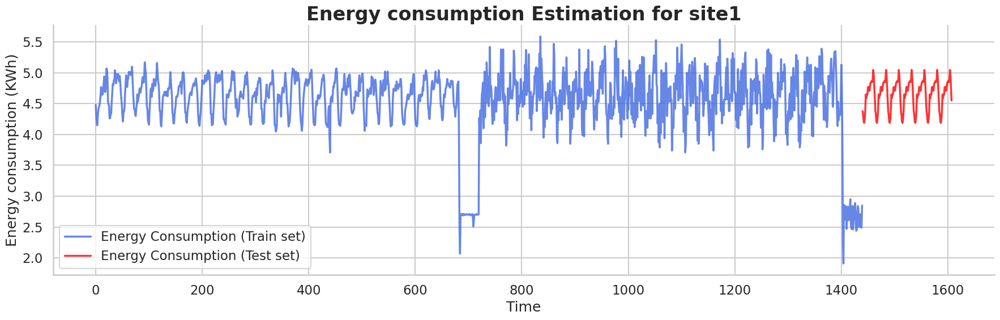

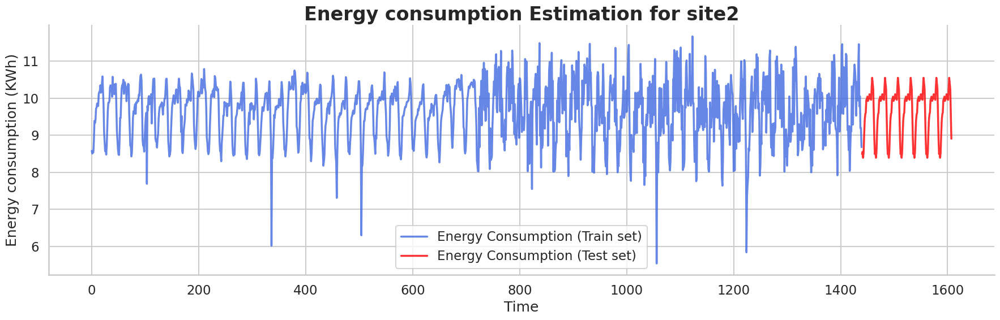

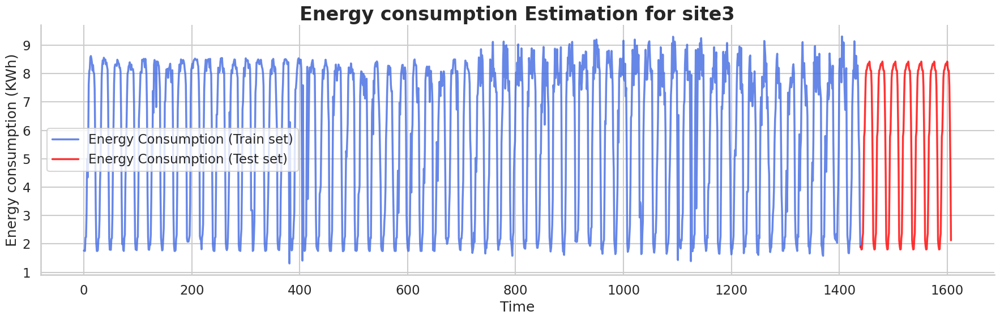

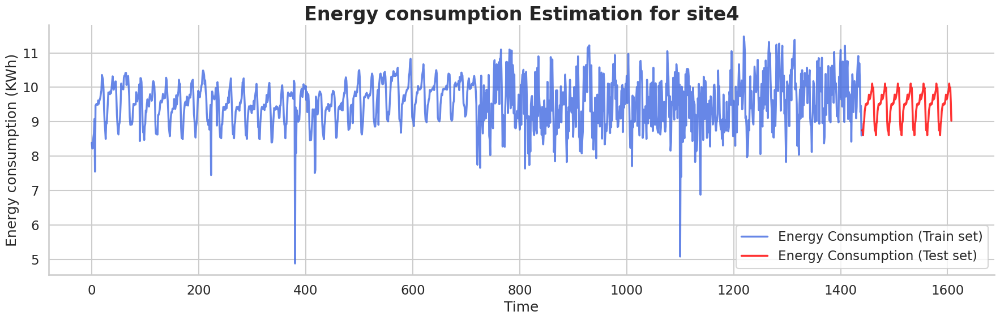

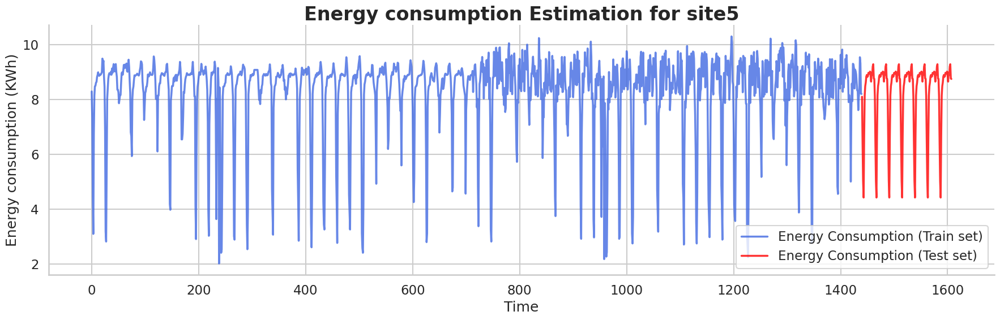

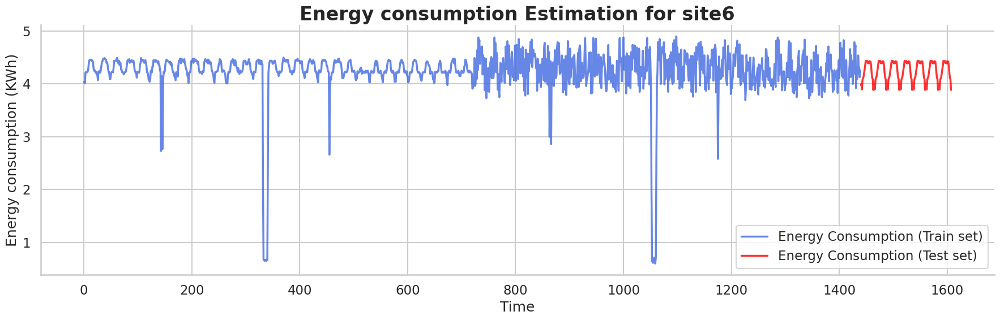

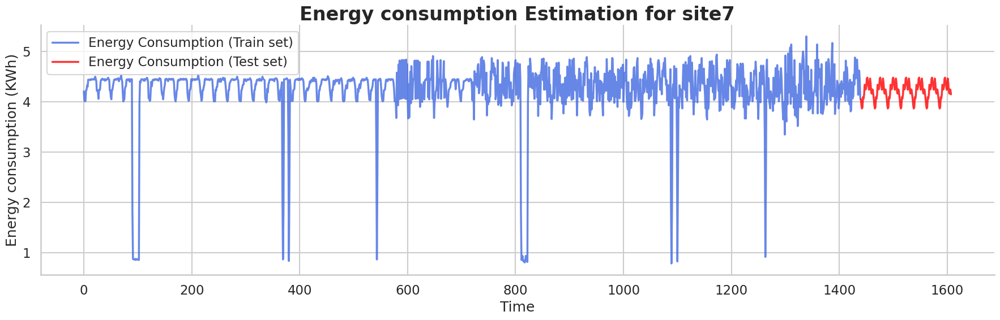

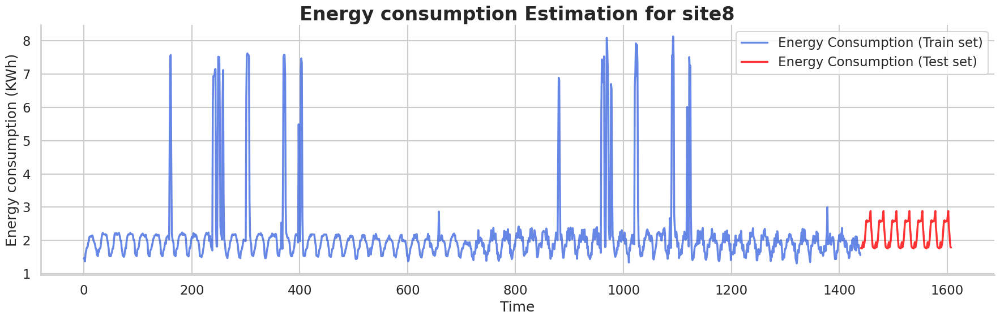

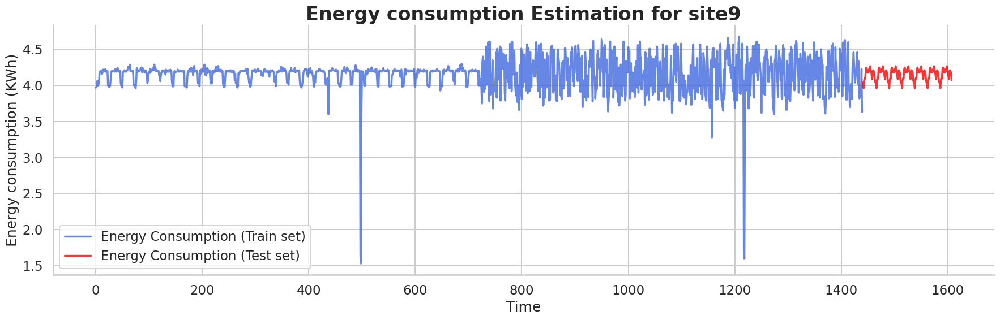

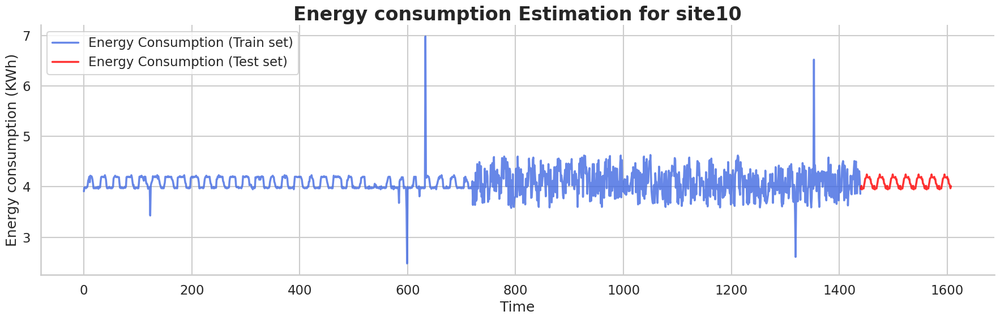

In [20]:
plot_solar_predictions(energy_consumption,solar_demand_predictions)

In [21]:
def plot_solar_predictions(data,pred_df):
    data=data[['Site Name','time','Energy Output(kWh)']]
    sites=data['Site Name'].unique()
    sorted_sites = np.sort([site for site in sites if site != 'site10'])
    sorted_sites = np.append(sorted_sites, 'site10')
    for site in sorted_sites:
        df=pred_df.loc[pred_df['Site Name']==site]
        site_df=data.loc[data['Site Name']==site]
        df_repeated = pd.concat([df.assign(Day=day) for day in range(61, 68)], ignore_index=True)
        df_repeated['time']=(df_repeated['Day']-1)*24+df_repeated['Hour']
        combined_df = pd.concat([df_repeated[['time', 'Energy Output(kWh)']], site_df[['time', 'Energy Output(kWh)']]], ignore_index=True)
        combined_df = combined_df.sort_values(by='time').reset_index(drop=True)

        sns.set_style("whitegrid")
        sns.set_context("talk")

        plt.figure(figsize=(18, 6))

        before_thresh = combined_df[combined_df['time'] <= 1439]
        plt.plot(before_thresh['time'], before_thresh['Energy Output(kWh)'], color='royalblue',
                 label='Solar Power (Train set)', linewidth=2.5, alpha=0.8)

        after_thresh = combined_df[combined_df['time'] > 1439]
        plt.plot(after_thresh['time'], after_thresh['Energy Output(kWh)'], color='red',
                 label='Solar Power (Test set)', linewidth=2.5, alpha=0.8)


        plt.title(f'Solar Power Estimation for {site}', fontsize=24, fontweight='bold')
        plt.xlabel('Time', fontsize=18)
        plt.ylabel(f'Solar Power (KWh)', fontsize=18)

        sns.despine()
        plt.tight_layout()
        plt.legend()
        plt.show()


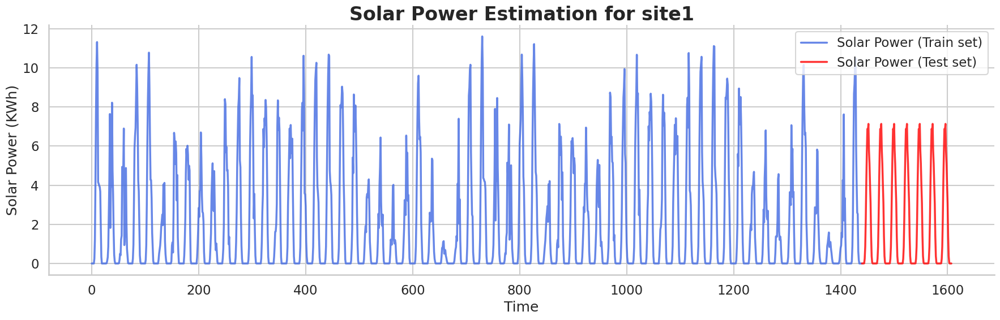

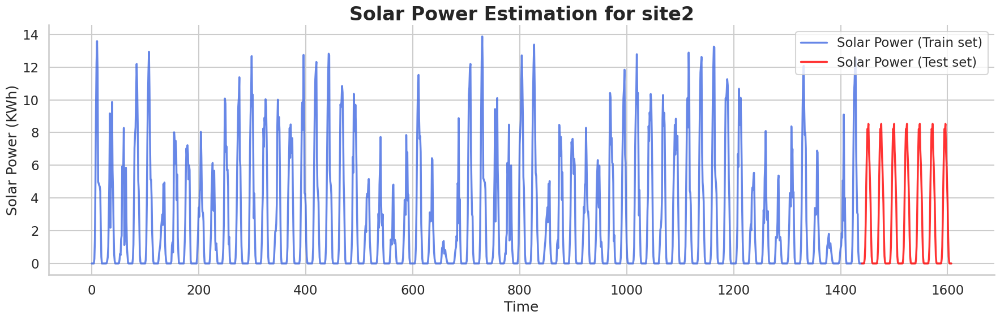

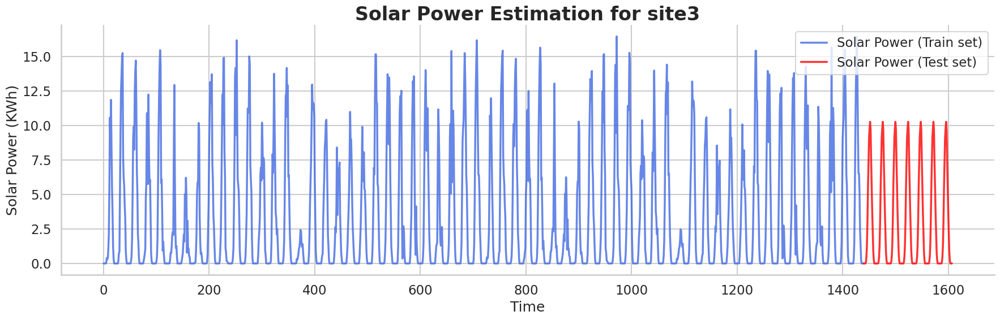

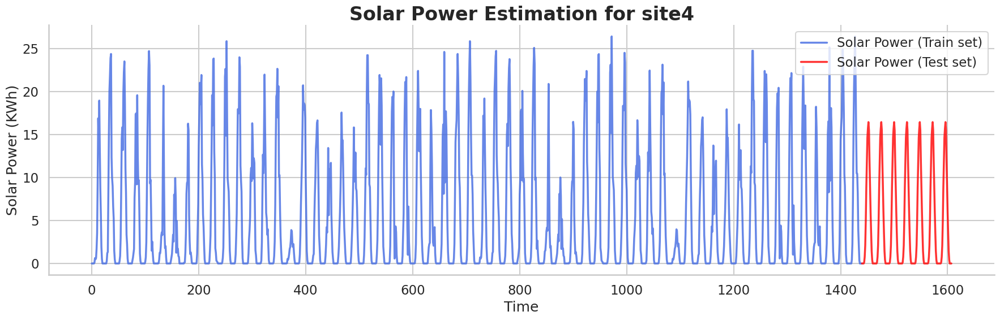

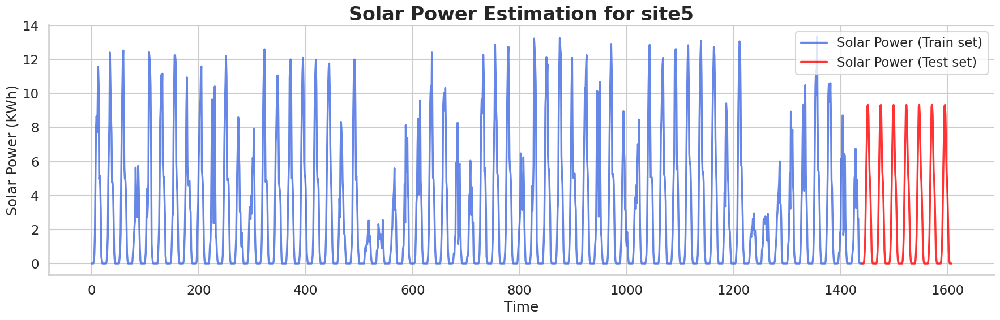

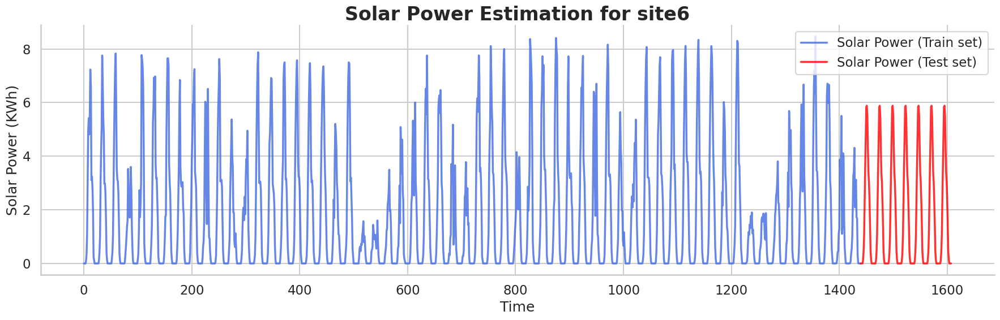

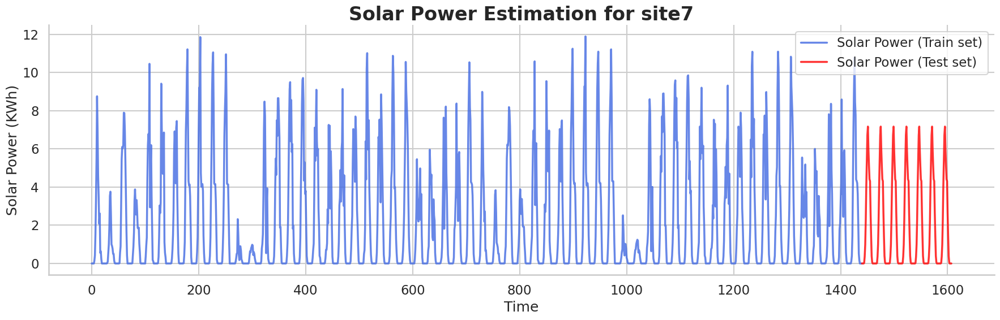

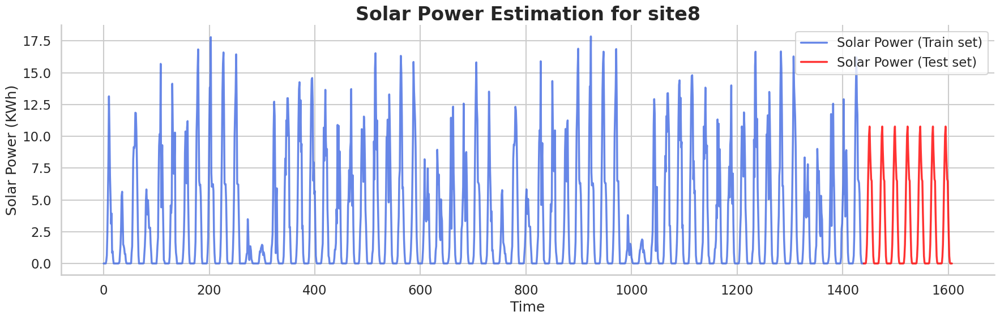

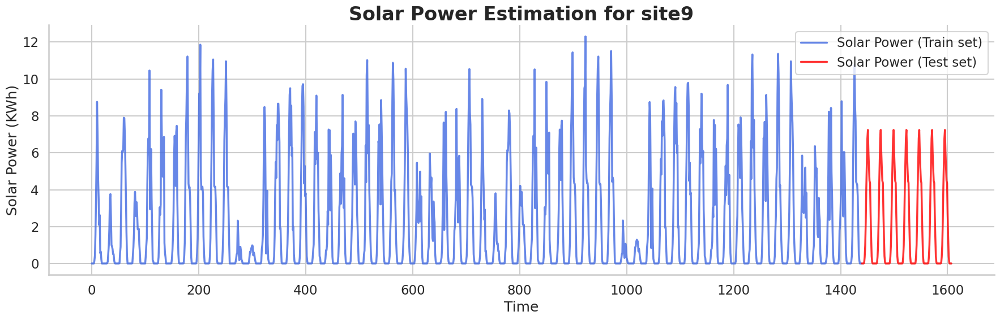

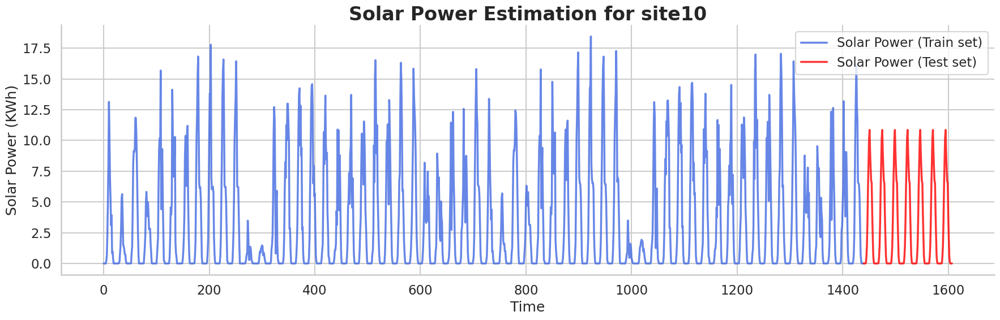

In [22]:
plot_solar_predictions(solar_power,solar_demand_predictions)

## Robust Energy Consumption Prediction

As demonstrated in the figure, the **approximation method** employed proved to be remarkably robust against the unpredictable, noisy fluctuations in energy consumption. These fluctuations presented a significant challenge, as any model errors leading to an overlooked demand peak could dramatically increase the likelihood of submitting an unfeasible solution in the private leaderboard.

#### Cautious Approach

To mitigate this risk, I adopted a cautious and calculated approach:

- **Focus on Maximum Loss Minimization**: Rather than solely minimizing the overall loss of the predictions, my strategy prioritized minimizing the maximum loss at each time step.
- **Compensatory Battery Usage**: This method ensured that the error at any given time could be compensated for by battery usage, providing an additional layer of reliability.

#### Core Objective

In essence, this decision reflects the core objective: safeguarding the feasibility of the predictions, even if it means sacrificing minor gains in aggregate accuracy.

This is why I chose this method for approximating energy consumption and solar power, ensuring a buffer against potential inaccuracies that could have far-reaching consequences.

In [23]:
class Strategy:

    def __init__(self, preds_df, site_info_df, Config):
        self.preds_df = preds_df
        self.site_info_df = site_info_df
        self.Config = Config

        ############## Initilization ##############
        self.current_soc = self.site_info_df['init SOC'].values[0]
        self.battery_capacity = self.site_info_df['battery capacity (Ah)'].values[0] * self.site_info_df['rated voltage（V）'].values[0] / 1000
        self.charge_coef = self.site_info_df['battery charge coefficient'].values[0]
        self.discharge_coef = self.site_info_df['battery discharge coefficient'].values[0]
        self.diesel_power = self.site_info_df['diesel power(kW)'].values[0]
        self.grid_power = self.site_info_df['grid power(kW)'].values[0]
        self.minimal_soc= self.site_info_df['DOD'].values[0]+ self.Config.Security_DOD_rate

    def update_battery_soc(self, current_soc, power_delta, battery_capacity, charge_coef, discharge_coef):
        ##### Charging #####
        if power_delta > 0:
            soc_delta = (power_delta * charge_coef) / battery_capacity
        ##### Discharging #####
        else:
            soc_delta = (power_delta * discharge_coef) / battery_capacity
        new_soc = current_soc + soc_delta
        return max(0, min(1, new_soc))

    def execute_strategy(self):
        strategy = []
        prev_diesel=False
        current_soc=self.current_soc
        grid_df=self.site_info_df ['grid outage plan'].values[0]
        solar_power_pred = self.preds_df['Energy Output(kWh)'].values[:24]
        demand_pred = self.preds_df['Total Energy(kWh)'].values[:24]

        for day in range(61, 68):
            for hour in range(24):

                solar_power = solar_power_pred[hour]
                demand = demand_pred[hour]
                grid_available = grid_df[hour + (day - 61) * 24]

                use_solar = False
                use_grid = False
                use_diesel = False

                # setting solar use to true during the day [solar_power>0]
                if solar_power > 0: use_solar = True


                """
                The commented code, was designed to verify if the next use of diesel is false and the current is true
                Because if it is the case i would rely on the battery of the last 15/30 minutes and reduce the diesel use

                PROBLEM: Due to the fact that predictions are not exactly true --> the current_SOC is also false:
                         Ex: let's say that the predictions gave that solar_power-demand>0 but actually it's negative
                         ===> In that case the use of battery is activated while current_SOC is still increasing which explains the unfeasable submission

                Conclusion: I opted to rely on the battery only 15 min at every start of the diesel generator if and only if the battery covers
                         4*required energy[15min] security_factor: 4, and use the battery basically as a security for the submission.
                """

                ############## Next Outage ##############

                # if (outage_index==len(site_config['grid outage plan'].values[0]) - 1):
                #     next_outage=False
                # else:
                #     next_outage=not(site_config['grid outage plan'].values[0][outage_index+1])


                ############## Verifying Next diesel Usage ##############

                # if hour in range(23):
                #     next_solar_available = solar_available_day[solar_available_day['Hour'] == hour+1]['solar_preds'].values[0]
                #     next_load_required = load_required_day[load_required_day['Hour'] == hour+1]['energy_preds'].values[0]
                #     next_diesel= next_outage and (next_solar_available-next_load_required<0)

                # else:
                #     next_solar_available=solar_pred[(solar_pred['Day'] == day)&(solar_pred['Hour'] == 0)]['solar_preds'].values[0]
                #     next_load_required=load_pred [(load_pred['Day'] == day)&(load_pred['Hour'] == 0)]['energy_preds'].values[0]
                #     next_diesel= next_outage and (next_solar_available-next_load_required<0)


                ############## USING SOLAR ##############

                power_balance=solar_power-demand

                ############## IF PB >0  ##############

                if power_balance>0:  ############## CHARGING BATTEREIS ##############
                    current_soc=self.update_battery_soc(current_soc, power_balance, self.battery_capacity, self.charge_coef, self.discharge_coef)

                ############## IF PB <0  ##############

                else:
                    if grid_available:
                        use_grid = True
                        power_balance+=self.grid_power

                        ############## CHARGING BATTEREIS ############## [According to the data the grid always covers the demand]
                        current_soc=self.update_battery_soc(current_soc, power_balance, self.battery_capacity, self.charge_coef, self.discharge_coef)
                        # If we have something OOD in the test: the battery is a security for that example

                    else:
                        discharge_capacity=((current_soc-self.minimal_soc)*self.battery_capacity)/self.discharge_coef
                        if (discharge_capacity>(abs(Config.Security_of_discharge_factor* (1/4) *power_balance)) and prev_diesel==False):

                            ############## DICHARGING BATTEREIS ##############
                            current_soc=self.update_battery_soc(current_soc, power_balance, self.battery_capacity, self.charge_coef, self.discharge_coef)
                            prev_diesel=True

                        else:
                            ############## USING Diesel ##############
                            use_diesel = True
                            power_balance+=self.diesel_power

                            ############## CHARGING BATTEREIS ##############
                            current_soc=self.update_battery_soc(current_soc, power_balance, self.battery_capacity, self.charge_coef, self.discharge_coef)
                            prev_diesel=use_diesel

                for quarter in range(4):
                    strategy.append({
                        'use_solar': use_solar,
                        'use_grid': use_grid,
                        'use_diesel': use_diesel,
                        'current_soc': current_soc,
                        'grid_available': grid_available,
                        'solar_power': solar_power,
                        'demand': demand,
                    })

        return strategy

In [24]:
print('Restarting time to add strategy latency')
start = time.time()
sites_strategies = {}
for site in site_info['Site Id'].unique():
    site_config = site_info[site_info['Site Id'] == site]
    site_preds = solar_demand_predictions[solar_demand_predictions['Site Name'] == site]
    site_strategy = Strategy(site_preds, site_config, Config)
    strategy_output = site_strategy.execute_strategy()
    sites_strategies[site] = strategy_output



output= []
for site_id, site_strategy in sites_strategies.items():
    for time_step, decision in enumerate(site_strategy):
        output.append({
            'site name': site_id,
            'time': time_step,
            'use_grid': decision['use_grid'],
            'use_diesel': decision['use_diesel'],
            'use_solar': decision['use_solar'],
            'current_soc': decision['current_soc'],
            'grid_available': decision['grid_available'],
            'solar_power': decision['solar_power'],
            'demand': decision['demand'],
        })

Restarting time to add strategy latency


## Strategy Post Processing

In [25]:
"""
Prefer: Is a function Designed to decide if two consecutive Diesel intervals should be merged or not according to the score
"""
def Prefer(interval_length,num_use_grid,interval_length_start,interval_length_end,current_max_interval):
    if interval_length+interval_length_start+interval_length_end>current_max_interval:
        new_max=interval_length+interval_length_start+interval_length_end
    else:
        new_max=current_max_interval
        
    # The score we will win if we merge two interval of diesel:
    win= Config.diesel_num_penalty+num_use_grid*15*Config.grid_usage_penalty # num_use_grid is the number of quarters where we used the grid 
                                                                                        # [will turn into False if merged]
    
    # The penalty we will get:
    # --> we add the number of minutes [the added interval length]
    # --> And since we kept track of the consecutive diesel intervals: we check if by merging them we get penalized also if new_max-current_max_interval>0
    lose = ((new_max-current_max_interval)*Config.diesel_max_time_penalty*15) + (interval_length*15*Config.diesel_usage_penalty)
    
    score_balance= win-lose
    return score_balance, new_max

"""
find_diesel_intervals: Is a function Designed to return a dict, which for every site_id have a first value of a list of tuples
Where:
      Each tuple (begin, end, count_grid) is a tracking for the beginning and end for every diesel start and cut and the number of 
      grid use between the current interval and the last one [of diesel use]; to keep track of the number of grid use we will deactivate and win
And the second value is the value of the maximum interval length of diesel use.
"""
def find_diesel_intervals(sites_strategies):
    d=dict()
    for site_id, strategy_i in sites_strategies.items():
        max_interval=0
        d[site_id]=([],0)
        count_grid=0
        site_strategy = strategy_i[:]
        time_step=0
        while(time_step<671):
            if site_strategy[time_step]['use_diesel']==True:
                start_diesel=time_step
                
                while(time_step<671)&(site_strategy[time_step]['use_diesel']==True):
                    end_diesel=time_step
                    time_step+=1
                    
                max_interval=max(max_interval, end_diesel-start_diesel+1)
                d[site_id][0].append((start_diesel,end_diesel,count_grid))
                d[site_id] = (d[site_id][0], max_interval)
                count_grid=0
            if site_strategy[time_step]['use_grid']==True:
                # counting the grid usage between the diesel intervals
                count_grid+=1   
            time_step+=1
    return d

"""
merge_diesel_interval: Is the function that is responsible to generate new diesel intervals lists to further update the strategy
Updating each time the max_diesel_interval_len 
"""

def merge_diesel_interval(sites_strategies, tracking_diesel_dict):    
    merged_dict=dict()
    for site_id, strategy_i in sites_strategies.items():
        merged_diesel_list=[]
        interval_diesel_list, current_max=tracking_diesel_dict[site_id]
        prev_diesel_interval=interval_diesel_list[0]
        for d_int in interval_diesel_list[1:]:
            score_balance, new_max=Prefer(Config.quarter*(d_int[0]-prev_diesel_interval[1]-1),d_int[-1],prev_diesel_interval[1]-prev_diesel_interval[0]+1,d_int[1]-d_int[0]+1,current_max)
            if score_balance<0:
                merged_diesel_list.append(prev_diesel_interval)
                prev_diesel_interval=d_int
            else:
                current_max=new_max
                prev_diesel_interval=(prev_diesel_interval[0],d_int[1],prev_diesel_interval[2])
        merged_diesel_list.append(prev_diesel_interval)
        merged_dict[site_id]=merged_diesel_list
    return merged_dict

###### Finally Update the Strategy ######

def update_strategy(merg_dict,sites_strategies):
    for site_id, strategy_i in sites_strategies.items():
        site_diesel_intervals=merg_dict[site_id]
        for tpl_intervals in site_diesel_intervals:
            start=tpl_intervals[0]
            end=tpl_intervals[1]
            for i in range(start,end+1):
                strategy_i[i]['use_grid']=False
                strategy_i[i]['use_diesel']=True
            sites_strategies[site_id]=strategy_i
    return sites_strategies
    

In [26]:
tracking_dict=find_diesel_intervals(sites_strategies)

In [27]:
merged_dict=merge_diesel_interval(sites_strategies,tracking_dict)

In [28]:
sites_strategies=update_strategy(merged_dict,sites_strategies)

In [29]:
latency += time.time() - start
print(f"Overall Data processing, modeling and inference Latency: {latency:.2f}s")

Overall Data processing, modeling and inference Latency: 0.20s


In [30]:
strategy_df = pd.DataFrame(output)
strategy_df.drop(columns=["current_soc", "grid_available", "solar_power", "demand"], axis=1).to_csv('2nd_place_submission.csv', index=False)

In [31]:
def getMaxTime(strategy):
    maxTime = 0
    for i in range(0, len(strategy)):
        batteryStatus = strategy[i]
        if not batteryStatus["use_diesel"]:
            continue
        curTime = 0
        while strategy[i]["use_diesel"]:
            curTime += 15
            i += 1
            if i == len(strategy):
                break

        if curTime > maxTime:
            maxTime = curTime

    return maxTime

In [32]:
def getDieselNum(strategy):
    dieselNum = 0
    if strategy[0]["use_diesel"]:
        dieselNum += 1
    for i in range(0, len(strategy) - 1):
        batteryStatus = strategy[i]
        nextBatteryStatus = strategy[i + 1]
        if (not batteryStatus["use_diesel"]) and nextBatteryStatus["use_diesel"]:
            dieselNum += 1
    return dieselNum

In [33]:
tt_cost = 0

print("=" * 115)
print(f"{'Site ID':^10} | {'Min SOC':^10} | {'Avg SOC':^10} | {'Solar Usage':^12} | {'Grid Usage':^12} | {'Diesel Usage':^13} | {'Diesel Starts':^14} | {'Total Cost':^12}")
print("=" * 115)

for site_id, strategy_i in sites_strategies.items():
    strategy = strategy_i[:]
    min_soc = min(decision['current_soc'] for decision in strategy)
    avg_soc = sum(decision['current_soc'] for decision in strategy) / len(strategy)
    solar_usage = sum(1 for decision in strategy if decision['use_solar'])
    grid_usage = sum(15 for decision in strategy if decision['use_grid'])
    diesel_usage = sum(15 for decision in strategy if decision['use_diesel'])
    diesel_max_time = getMaxTime(strategy)
    diesel_num = getDieselNum(strategy)

    diesel_num_cost = diesel_num * Config.diesel_num_penalty
    diesel_usage_cost = diesel_usage * Config.diesel_usage_penalty
    diesel_max_time_cost = diesel_max_time * Config.diesel_max_time_penalty
    grid_usage_cost = grid_usage * Config.grid_usage_penalty
    cost = diesel_num_cost + diesel_usage_cost + diesel_max_time_cost + grid_usage_cost
    tt_cost += cost

    print(f"{site_id[4:]:^10} | {min_soc:>8.4f}  | {avg_soc:>8.4f}  | {solar_usage:^12} | {grid_usage:^12} | {diesel_usage:^13} | {diesel_num:^14} | {cost:>10.2f}")

print("=" * 115)
print(f"{'Average cost':<40}: {tt_cost / 10:.2f}")
   

 Site ID   |  Min SOC   |  Avg SOC   | Solar Usage  |  Grid Usage  | Diesel Usage  | Diesel Starts  |  Total Cost 
    1      |   0.4943  |   0.9957  |     504      |     1140     |     6420      |       8        |   10131.00
    2      |   0.2777  |   0.9780  |     504      |     3840     |     6240      |       5        |   10524.00
    3      |   0.2928  |   0.9811  |     476      |     3300     |     5100      |       9        |    9765.00
    4      |   0.2448  |   0.9644  |     476      |     2160     |     5340      |       8        |    9249.00
    5      |   0.3619  |   0.9921  |     448      |     4200     |     5040      |       8        |    9630.00
    6      |   0.3161  |   0.9860  |     448      |     1500     |     6900      |       8        |   10815.00
    7      |   0.4379  |   0.9943  |     448      |     3240     |     3900      |       8        |    8079.00
    8      |   0.3462  |   0.9892  |     448      |     2760     |     3120      |       8        |    7008.

# Strategy Performance Summary

| **Site ID** | **Min SOC** | **Avg SOC** | **Solar Usage** | **Grid Usage** | **Diesel Usage** | **Diesel Starts** | **Total Cost** |
|-------------|-------------|-------------|------------------|----------------|-------------------|-------------------|----------------|
| 1           |   0.4943    |   0.9957    |     504          |      76        |      428          |       8           |   10131.00     |
| 2           |   0.2777    |   0.9780    |     504          |     256        |      416          |       5           |   10524.00     |
| 3           |   0.2928    |   0.9811    |     476          |     220        |      340          |       9           |    9765.00     |
| 4           |   0.2448    |   0.9644    |     476          |     144        |      356          |       8           |    9249.00     |
| 5           |   0.3619    |   0.9921    |     448          |     280        |      336          |       8           |    9630.00     |
| 6           |   0.3161    |   0.9860    |     448          |     100        |      460          |       8           |   10815.00     |
| 7           |   0.4379    |   0.9943    |     448          |     216        |      260          |       8           |    8079.00     |
| 8           |   0.3462    |   0.9892    |     448          |     184        |      208          |       8           |    7008.00     |
| 9           |   0.2642    |   0.9742    |     448          |     132        |      340          |       8           |    8964.00     |
| 10          |   0.4327    |   0.9940    |     448          |     168        |      280          |       7           |    7842.00     |
| **Average Cost** |       |             |                  |                |                   |                   | **9200.70**    |

---

> **Note:** The table summarizes the performance of the strategy across different sites - matches the submission score

In [34]:
def strategy_summary(data):
    data['power_balance'] = data['solar_power'] - data['demand']
    sites=data['site name'].unique()
    sorted_sites = np.sort([site for site in sites if site != 'site10'])
    sorted_sites = np.append(sorted_sites, 'site10')
    for site in sorted_sites:
        site_data= data.loc[data['site name']==site]
        sns.set_style("whitegrid")
        sns.set_context("talk")

        plt.figure(figsize=(18, 6))
        plt.plot(site_data['time'], site_data['power_balance'], color='royalblue', label='Power balance', linewidth=2.5, alpha=0.8)
        
        negative_power = site_data['power_balance'] < 0
        
        # Grid activated
        plt.fill_between(site_data['time'], 0, site_data['power_balance'], where=negative_power & site_data['use_grid'],facecolor='none',
                  edgecolor='deepskyblue', hatch='/////', label='Grid Usage', alpha=0.4)
        # Diesel activated
        plt.fill_between(site_data['time'], 0, site_data['power_balance'], where=negative_power & site_data['use_diesel'],facecolor='none',
                  edgecolor='red', hatch='/////', label='Diesel Usage', alpha=0.4)
        # Rely on battery
        plt.fill_between(site_data['time'], 0, site_data['power_balance'], where=negative_power & ~(site_data['use_diesel'] | site_data['use_grid']),
                         facecolor='none',edgecolor='green', hatch='/////', label='Battery Usage', alpha=0.4)

        plt.axhline(0, color='black', linewidth=1.5) 
        plt.title(f'strategy applied to {site}', fontsize=22, fontweight='bold')
        plt.xlabel('Time', fontsize=16)
        plt.ylabel('Power Balance (kWh)', fontsize=16)

        plt.legend(loc='best', fontsize=12)
        plt.grid(True, linestyle='--', alpha=0.6)

        plt.tight_layout()
        plt.show()

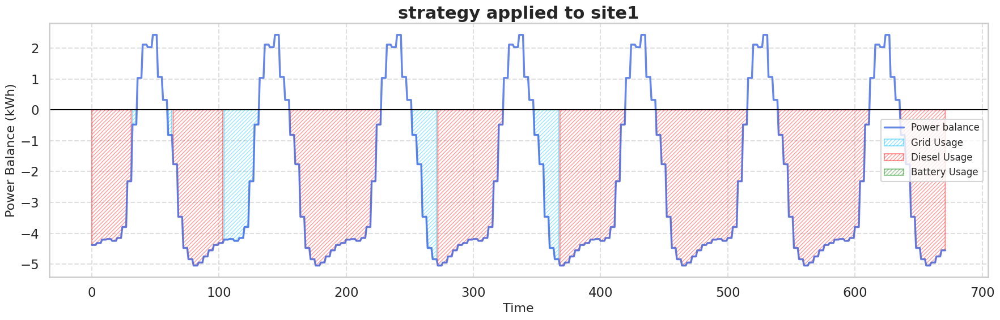

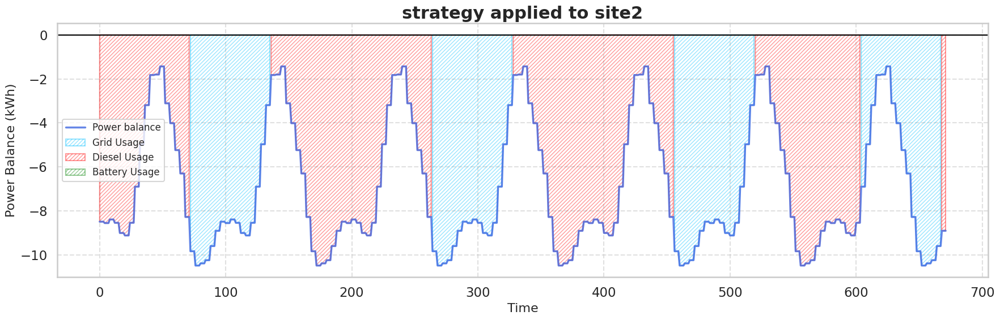

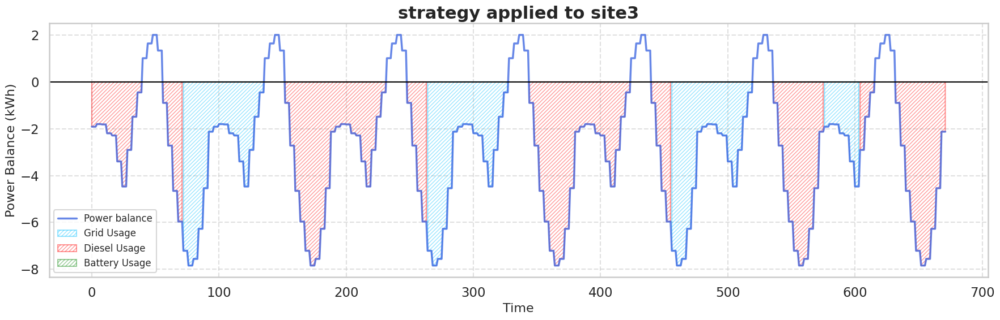

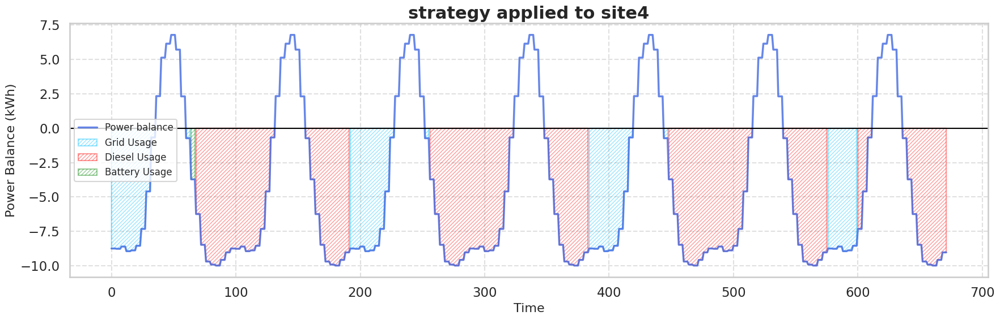

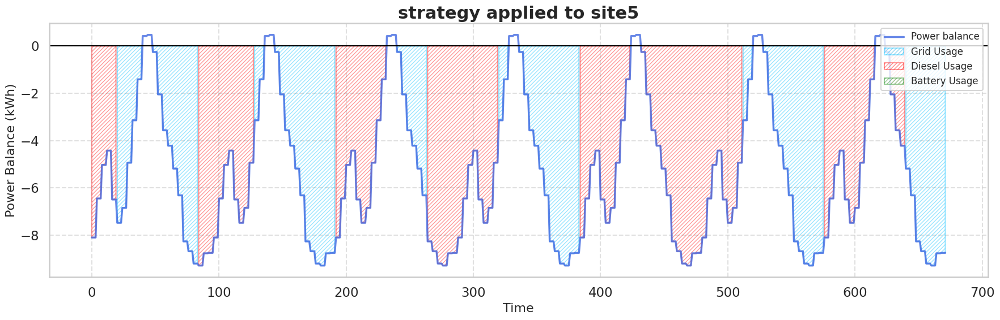

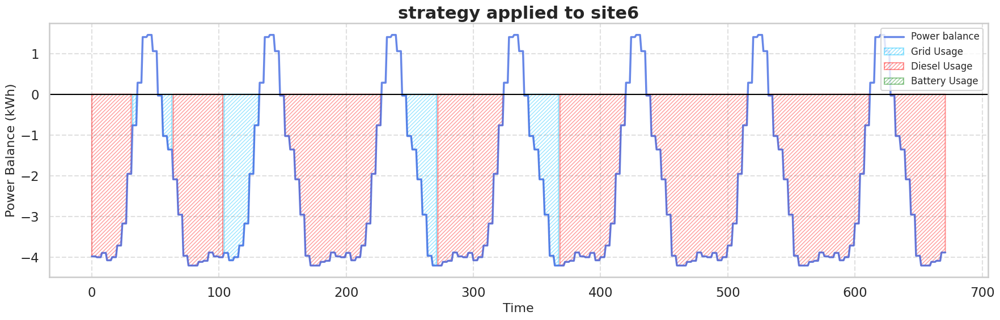

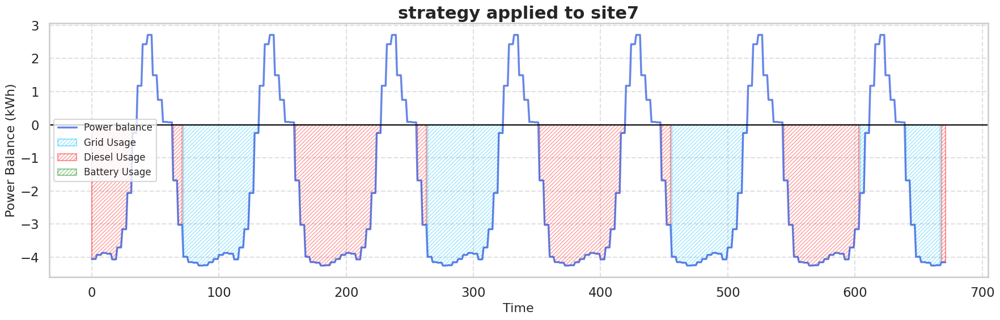

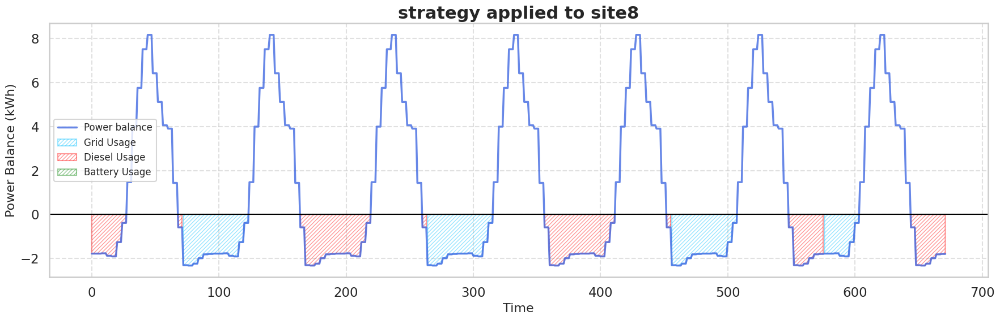

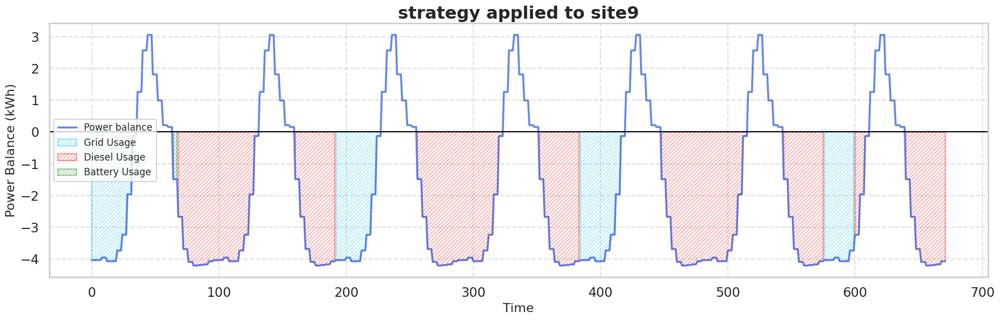

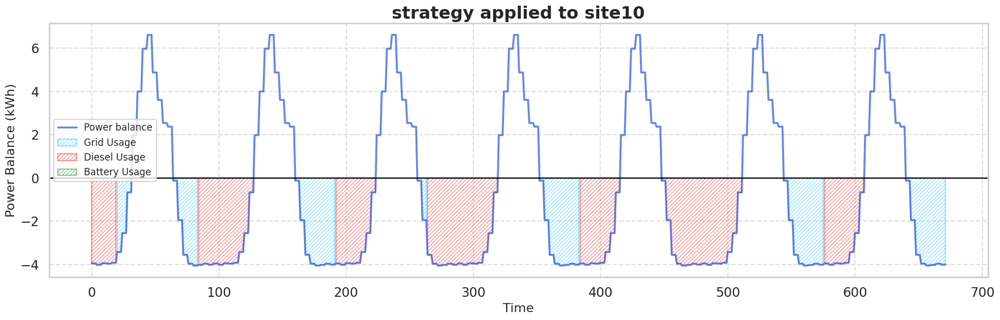

In [35]:
strategy_summary(strategy_df)